# [Bacterial Colony Growth](@id Bacteries)

In this example, we are going to create a bacterial model and grow a colony using it.

 - The implementation of the force interaction dynamics is the one presented by [Volfson et al. (2008)](https://www.pnas.org/doi/abs/10.1073/pnas.0706805105)
 - We use GPU accelerated dynamics

As described in other models, it is advised that the models are constructed by parts to avoid having to find bugs in a very complex system. Hence, we will split the model in two parts:

 - Forces model
 - Growth model

## Load the packages

In [1]:
using Base.Threads
println("Usando ", nthreads(), " threads 😎")

Usando 1 threads 😎


In [2]:
# import Pkg
# Pkg.activate("../")
# Pkg.instantiate()


In [3]:
# import Pkg; Pkg.add(["Revise", "GLMakie"])

In [4]:
# using Revise
# using CellBasedModels
# using CUDA
# using Distributions
# using GLMakie
# # using GeometryBasics
# import GLMakie: Point3f, Cylinder, Sphere, NoShading #Can be changes to Cairo or CLMakie

In [5]:
import Pkg

# Activa el entorno del proyecto
Pkg.activate("../../../")


# Resuelve y asegura dependencias
Pkg.resolve()
Pkg.instantiate()


# Carga los paquetes de forma ordenada
using Revise
using CellBasedModels
ENV["JULIA_CUDA_USE_BINARYBUILDER"] = false  # (opcional, fuerza compilación local)
using CUDA
CUDA.set_runtime_version!(v"12.2")
using Distributions
using CairoMakie
using JSON

# Importa funciones específicas después
import CairoMakie: Point3f, Cylinder, Sphere, NoShading

CairoMakie.activate!()


  Activating project at `~/Escritorio/Projects/Pushing/ABM_CBM`
  No Changes to `~/Escritorio/Projects/Pushing/ABM_CBM/Project.toml`
  No Changes to `~/Escritorio/Projects/Pushing/ABM_CBM/Manifest.toml`
┌ Info: Configure the active project to use CUDA 12.2; please re-start Julia for this to take effect.
└ @ CUDA /home/julia/.julia/packages/CUDA/jdJ7Z/lib/cudadrv/version.jl:82


## Forces model

We already use the defined forces model that is implemented in CBqodels. This is an exact copy of the rod model that you can find already predefined in `Models/rods.jl`. You can check the `Models` section of the documentation for more details.


In [6]:
rod2D = ABM(2,
    agent = Dict(
            :theta=>Float64,
            :d=>Float64,
            :l=>Float64,
            :fx=>Float64,
            :fy=>Float64,
            :W=>Float64,
            :eta=>Float64,
        ),    #Local Interaction Parameters

    model = Dict(
            :E=>Float64,
            :L=>Float64,
        ),        #Global parameters

    agentODE = quote

        fx = 0
        fy = 0
        W = 0
        @loopOverNeighbors i2 begin
            #Use the model provided in the documentation
            Fijx, Fijy, Wij = CBMModels.repulsiveForces_rods(x,y,d,l,theta,
                                    x[i2],y[i2],d[i2],l[i2],theta[i2],eta, E)

            #Append the repulsive forces
            fx += Fijx
            fy += Fijy
            W += Wij

            if x - (l+d)/2 * cos(theta) < -L/2
                #Use the model provided in the documentation
                Fijx, Fijy, Wij = CBMModels.repulsiveForces_rods(x + L,y,d,l,theta,
                                    x[i2],y[i2],d[i2],l[i2],theta[i2],eta, E)
                
                #Append the repulsive forces
                fx += Fijx
                fy += Fijy
                W += Wij
            elseif x + (l+d)/2 *cos(theta) > L/2 
                #Use the model provided in the documentation
                Fijx, Fijy, Wij = CBMModels.repulsiveForces_rods(x - L,y,d,l,theta,
                                    x[i2],y[i2],d[i2],l[i2],theta[i2],eta, E)

                #Append the repulsive forces
                fx += Fijx
                fy += Fijy
                W += Wij
            end

        end
        #Equations
        dt(x) =  fx 
        dt(y) =  fy 
        dt(theta) =  W
    end,

    agentRule = quote
        if y<simBox[2,1]
            y=simBox[2,1]
        end
        if x < -L/2  
            x = x + L 
        elseif x > L/2
            x = x - L
        end
    end,

    neighborsAlg=CBMNeighbors.CellLinked(cellEdge=4),
    platform=CPU(),
    agentAlg = CBMIntegrators.Heun()
);


### Initialize a coqunity with two bacteries and check forces

In [7]:
com = Community(rod2D,
            N=30,
            dt=0.0001,
            simBox = [-10 10;-10 10.],
            );


#Natural units scales
m = 1.E3 #g
t = 1/(60*60) # h
d = 1.E6 #um


com.E=6* 1.E5 *m/(t^2*d) #Pa
com.eta=150 *m/(t^2*d) #Pa h
 

com.d = 1.        
com.l = 3.99      

com.L=10



com.x = 0
com.y = 0
com.theta = 0;


In [8]:
com.N

30

In [9]:
for i in 1:com.N
    com.theta[i] = rand() * π
    # com.x[i] = rand()*10-5
    # com.y[i] = rand()*10-5
    com.x[i] = rand()*0.5
    com.y[i] = 0
    com.l[i] = 3.0
    com.d[i] = 1.0

end

In [10]:
evolve!(com,steps=1000,saveEach=100,preallocateAgents=com.N)


In [11]:
function plotAgents2D!(ax, x, y, d, l, angle, p; colormap=:inferno, kargs...)
    for (xi, yi, li, di, ai, pi) in zip(x, y, l, d, angle, p)



            colorval = pi
            # colormap = :inferno
            meshscatter!(ax,
                [xi + li/2 * cos(ai)],
                [yi + li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color = [colorval],
                colormap = colormap,
                kargs...
            )
            meshscatter!(ax,
                [xi - li/2 * cos(ai)],
                [yi - li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color = [colorval],
                colormap = colormap,
                kargs...
            )
            meshscatter!(ax,
                [xi],
                [yi];
                marker = Cylinder(Point3f(-.5, 0, 0), Point3f(.5, 0, 0), Float32(1)),
                markersize = [Point3f(li, di/2, di/2)],
                rotation = [ai],
                color = [colorval],
                colormap = colormap,
                kargs...
            )

    end
    return
end


plotAgents2D! (generic function with 1 method)

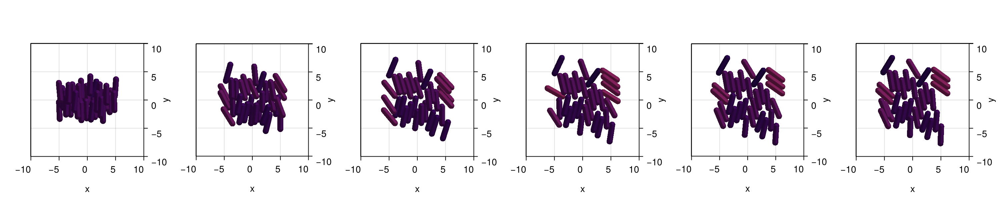

CairoMakie.Screen{IMAGE}


In [12]:
fig = Figure(size=(1500,300))

js= [1, length(com)]
for (i,j) in enumerate([1:round(Int,length(com)/4):length(com);length(com)])
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    plotAgents2D!(
    ax,
    com[j][:x],
    com[j][:y],
    com[j][:d],
    com[j][:l],
    com[j][:theta],
    com[j][:theta],
    colorrange = (0, 2*pi)
)

    xlims!(-10,10)
    ylims!(-10,10)
end

display(fig)

In [13]:
com[:fx]

30-element Vector{Float64}:
    6.207694945307979
    0.2500488957495719
   -0.6496699053493178
  -10.55396321162392
   16.920093015194954
  -17.317067568814224
   -5.829106472853049
   44.505791201410844
  -59.627078070779355
   59.48510511220886
    ⋮
  -45.54240596362469
 -217.88786662645202
    0.011301932246217561
    0.4415617975959908
   -1.4834773340155074
   -8.046810079488965
    0.0
   -0.6959549229923914
    3.232082823351757

In [14]:

function log_community_state(parameters::OrderedDict, t::Int, path::String = "Tods_c.txt")
    # Convert keys to strings so JSON can serialize them
    string_keys = Dict(string(k) => v for (k, v) in parameters)
    # Build entry
    entry = Dict("t" => t, "parameters" => string_keys)
    # Save as a JSON line
    open(path, "a") do io
        println(io, JSON.json(entry))
    end
end


function load_parameters_log(path::String = "Tods_c.txt")
    log = Dict{Int, OrderedDict{Symbol, Any}}()
    for line in eachline(path)
        entry = JSON.parse(line)
        t = entry["t"]
        raw_params = entry["parameters"]
        params = OrderedDict(Symbol(k) => v for (k, v) in raw_params)
        log[t] = params
    end
    times = sort(collect(keys(log)))
    com_array = [log[t] for t in times]
    return com_array, times
end



load_parameters_log (generic function with 2 methods)

In [15]:
function plotMixedAgents2D!(ax, x, y, d, l, angle, type, p; kargs...)
    for (xi, yi, li, di, ai, ti, pi) in zip(x, y, l, d, angle, type, p)


        if ti== 0  # rods
            # colorval = pi
            # colormap = :Blues
            meshscatter!(ax,
                [xi + li/2 * cos(ai)],
                [yi + li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color = [:blue],
                # colormap = colormap,
                kargs...
            )
            meshscatter!(ax,
                [xi - li/2 * cos(ai)],
                [yi - li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color = [:blue],

                # colormap = colormap,
                kargs...
            )
            meshscatter!(ax,
                [xi],
                [yi];
                marker = Cylinder(Point3f(-.5, 0, 0), Point3f(.5, 0, 0), Float32(1)),
                markersize = [Point3f(li, di/2, di/2)],
                rotation = [ai],
                color = [:blue],

                kargs...
            )
        else  # puntos
            colorval = pi
            colormap = :Reds
            meshscatter!(ax,
                [xi + li/2 * cos(ai)],
                [yi + li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color = [:red],
                kargs...
            )
            meshscatter!(ax,
                [xi - li/2 * cos(ai)],
                [yi - li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color = [:red],
                colormap = colormap,
                kargs...
            )
            meshscatter!(ax,
                [xi],
                [yi];
                marker = Cylinder(Point3f(-.5, 0, 0), Point3f(.5, 0, 0), Float32(1)),
                markersize = [Point3f(li, di/2, di/2)],
                rotation = [ai],
                color = [:red],
                colormap = colormap,
                kargs...
            )
        end

    end
    return
end


plotMixedAgents2D! (generic function with 1 method)

## Growth model

We construct over the forces model to add bacterial growth and cell division rules.

In [16]:
rods2dGrowth = ABM(2,
    baseModelInit = [rod2D],

    agent = Dict(
                :lTarget => Float64,
                :growth=>Float64,
            ),

    model = Dict(
                :σlTarget=>Float64,
                :lMax=>Float64,
            ),

 
    agentODE = quote    
               dt(l) = l*growth
    end,

    agentRule = quote #Bound cells
        #Add division
        if l > lTarget
            ww = CBMDistributions.uniform(-1,1)*1.E-2 #To add some random torque at division time
            
            @addAgent(
                    x=(l+d)/4*cos(theta)+x,
                    y=(l+d)/4*sin(theta)+y,
                    l=(l-d)/2,
                    lTarget = CBMDistributions.uniform(lMax-σlTarget,lMax+σlTarget),
                    W=ww)
            #Add a second cell
            @addAgent(
                    x=-(l+d)/4*cos(theta)+x,
                    y=-(l+d)/4*sin(theta)+y,
                    l=(l-d)/2,
                    lTarget = CBMDistributions.uniform(lMax-σlTarget,lMax+σlTarget), #New target length at which the bactery should divide
                    W=ww)
            #Remove the old cell
            @removeAgent()
        end
  
    end,

    neighborsAlg=CBMNeighbors.CellLinked(cellEdge=4),
    platform=CPU(),
    agentAlg=CBMIntegrators.Heun(),
    mediumAlg=DifferentialEquations.Euler(),
);

## Grow colony from one cell

In [71]:
com = Community(rods2dGrowth,
            N=25,
            dt=0.0001,
            simBox = [-70 70;-70 70.],
            NMedium=[70,70],
            );


#Natural units scales
m = 1.E3 #g
t = 1/(60*60) # h
d = 1.E6 #um


com.E=1* 1.E6 *m/(t^2*d) #Pa
com.eta=200 *m/(t^2*d) #Pa h

com.growth = 1
com.lMax = 4.     
com.σlTarget = 1. 

 
com.d = 1.        
com.l = 3.99      
com.lTarget = 4.  

com.L=50

com.x = 0
com.y = 0
com.theta = 0;

In [72]:
mean(rand(100))

0.47943404601211187

In [73]:
for i in 1:com.N
    com.theta[i] = rand() * π
    com.x[i] = com.L[1]*(rand()-1/2)
    # com.y[i] = rand()*10+2*com.simBox[2,1]/3
    com.y[i] = com.simBox[2,1]
    com.l[i] = 3.79 + rand()*0.2 
end

In [ ]:
steps=Int(round(5/com.dt))
# saveEach=steps/100
saveEach=Int(round(10/com.dt))/100
# steps=100000
# saveEach=10000
N=com.N*3 

loadToPlatform!(com,preallocateAgents=N)
open("Tods_c.txt", "w") do f
    # clear file at start
end
for step in 1:steps
    
    step!(com)

    if step % saveEach == 0
        bringFromPlatform!(com)
        if N - com.N[1] <= 0
                println("Step ",step, " N: ", com.N[1], " preallocateAgents: ", N)
                @warn "More agents than preallocateAgents, stopping simulation."
                break
        elseif   N - com.N[1]  < 4*com.N[1]
                N = 15*com.N[1]
        end 
        println("Step ",step, " N: ", com.N[1])
        log_community_state(com.parameters, step)
        loadToPlatform!(com,preallocateAgents=N)
    end
end

bringFromPlatform!(com)


Step 1000 N: 50
Step 2000 N: 50
Step 3000 N: 50
Step 4000 N: 50
Step 5000 N: 50
Step 6000 N: 50
Step 7000 N: 50
Step 8000 N: 60
Step 9000 N: 70
Step 10000 N: 81
Step 11000 N: 90
Step 12000 N: 98
Step 13000 N: 100
Step 14000 N: 100
Step 15000 N: 100
Step 16000 N: 100
Step 17000 N: 100
Step 18000 N: 109
Step 19000 N: 129
Step 20000 N: 148
Step 21000 N: 170
Step 22000 N: 187
Step 23000 N: 198
Step 24000 N: 200
Step 25000 N: 200
Step 26000 N: 200
Step 27000 N: 210
Step 28000 N: 238
Step 29000 N: 281
Step 30000 N: 320
Step 31000 N: 353
Step 32000 N: 383
Step 33000 N: 397
Step 34000 N: 400
Step 35000 N: 400
Step 36000 N: 401
Step 37000 N: 420
Step 38000 N: 460
Step 39000 N: 530


In [57]:
prev_steps = 0
# prev_steps = Int(round(0.8/com.dt))
steps=Int(round(1/com.dt))
com.growth = 0
open("Tods_c.txt", "w") do f
    # clear file at start
end

loadToPlatform!(com,preallocateAgents=N)


for step in 1+prev_steps:steps
    
    step!(com)


    if step % saveEach == 0
        bringFromPlatform!(com)
        if N - com.N[1] <= 0
                println("Step ",step, " N: ", com.N[1], " preallocateAgents: ", N)
                @warn "More agents than preallocateAgents, stopping simulation."
                break
        elseif   N - com.N[1]  < 4*com.N[1]
                N = 15*com.N[1]
        end 
        println("Step ",step, " N: ", com.N[1])
        log_community_state(com.parameters, step)
        loadToPlatform!(com,preallocateAgents=N)
    end
end
bringFromPlatform!(com)

Step 1000 N: 800
Step 2000 N: 800
Step 3000 N: 800
Step 4000 N: 800
Step 5000 N: 800
Step 6000 N: 800
Step 7000 N: 800
Step 8000 N: 800
Step 9000 N: 800
Step 10000 N: 800


In [58]:
com_load,times=load_parameters_log("Tods_c.txt")


(OrderedDict{Symbol, Any}[OrderedDict(:W => Any[-25.460900981630783, -99.53287875792141, 347.563608857437, -118.37662198525854, 439.2093419425431, 296.10032259715, -253.9898150347042, 19.10829653769406, -10.573186942206078, -84.05555252375655  …  -507.8131002394837, -548.3287975230248, 85.45350935438478, 574.181245176165, 1.2599800047551089, 200.47237078202733, 25.505212619501545, 395.0512096929581, 705.2203554471857, 55.28424817874284], :fx => Any[-14.020316712927858, -20.55017554818636, 0.32053896521224345, 11.164446449366366, -17.638827314789594, -24.805635150150653, 69.9020941095409, 23.97626367625523, -24.690332138007122, 25.391907694028923  …  -22.824158291269327, 46.36796810632782, 12.687431580932085, -4.627576988250155, 0.46737358513963856, 0.9238894158335569, 2.142418323457618, -75.24810834010538, -202.94251001804932, 41.39222218682596], :x => Any[-0.1299903215175246, 19.013821460511192, 2.4326808289436115, -3.8503462491318556, -4.207526978784449, 24.913861776182678, 19.837064

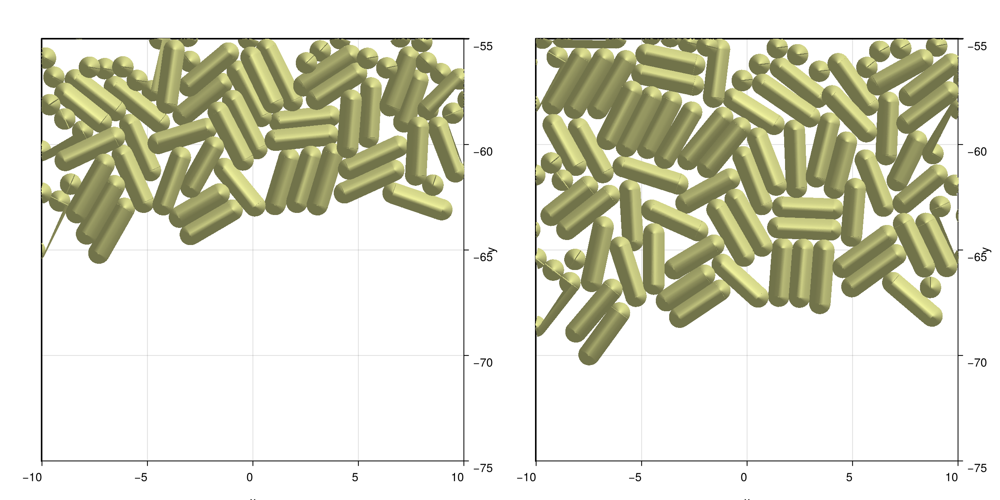

CairoMakie.Screen{IMAGE}


In [59]:


fig = Figure(size=(1200,600))

js = [1, length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:d],
    colorrange = (0, 0.03)
    )

    xlims!(-10,10)
    ylims!(-75,-55)
end

display(fig)

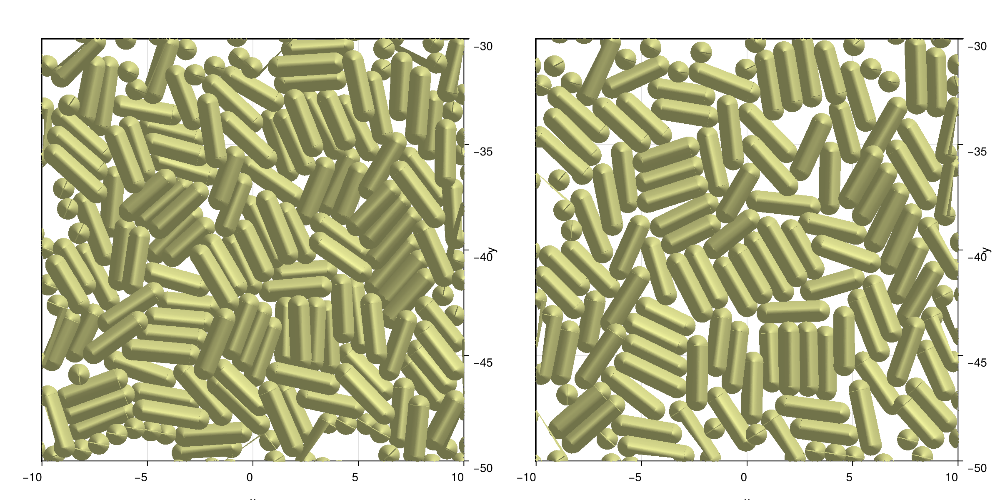

CairoMakie.Screen{IMAGE}


In [60]:


fig = Figure(size=(1200,600))

js = [1, length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:d],
    colorrange = (0, 0.03)
    )

    xlims!(-10,10)
    ylims!(-50,-30)
end

display(fig)

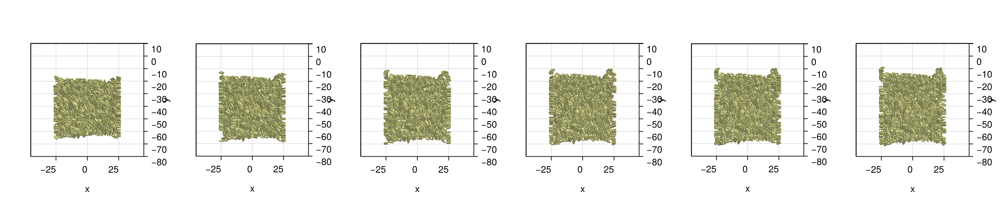

CairoMakie.Screen{IMAGE}


In [61]:
com_load,times=load_parameters_log("Tods_c.txt")

fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:d],
    colorrange = (0, 0.03)
    )

    xlims!(-45,45)
    ylims!(-80,10)
end

display(fig)

In [35]:
saveJLD2("biofilm0.jld2",com)


In [36]:
com_aux = loadJLD2("biofilm0.jld2")


Community with 800 agents.


In [ ]:
rods_PGA = ABM(2,

    agent = Dict(
                :lTarget => Float64,
                :type => Int,
                :Kc => Float64, #Half saturation constant for the medium
                :growth=>Float64,
                :generation => Int,
                :v => Float64, 
            ),

    model = Dict(
                :σlTarget=>Float64,
                :lMax=>Float64,
                :cm => Float64, #Medium concentration
                :beta_c => Float64, #Growth rate of the cells in the medium
                :alpha_c => Float64,  #Decay rate of the cells in the medium
                :D_PGA=>Float64, #Diffusion coefficient for the medium
                :delta_PGA=>Float64, #Decay rate of the medium
                :alpha_PGA=>Float64, #Decay rate of the cells in the medium
                :Kch => Float64, #Half saturation constant for the medium
                :ymax => Float64, #Maximum growth rate of the cells in the medium
                :gamma_c => Float64, #Decay rate of the cells in the medium
                :gamma_d => Float64, #Decay rate of the cells in the medium
                :a_c => Float64, #Decay rate of the cells in the medium
                :a_d => Float64, #Decay rate of the cells in the medium
                :D_c => Float64,
                :ymax => Float64, #Maximum distance for the decay of the medium
                :L => Float64, #Length of the simulation box

            ),
    
    medium = Dict(
        :c => Float64,        #Add a medium parameter
        :PGA => Float64,        #Add a medium parameter
        :Hx => Float64,  #Add a medium parameter
        :Hy => Float64,        #Add a medium parameter
        :D_eff => Float64,
        :alpha_eff => Float64, #Decay rate of the cells in the medium
    ),


 
    agentODE = quote    
        fx = 0
        fy = 0
        W = 0

        @loopOverNeighbors i2 begin
            #Use the model provided in the documentation
            Fijx, Fijy, Wij = CBMModels.repulsiveForces_rods(x,y,d,l,theta,
                                    x[i2],y[i2],d[i2],l[i2],theta[i2],eta, E)

            #Append the repulsive forces
            fx += Fijx
            fy += Fijy
            W += Wij

            if x - (l+d)/2 * cos(theta) < -L/2
                #Use the model provided in the documentation
                Fijx, Fijy, Wij = CBMModels.repulsiveForces_rods(x + L,y,d,l,theta,
                                    x[i2],y[i2],d[i2],l[i2],theta[i2],eta, E)
                
                #Append the repulsive forces
                fx += Fijx
                fy += Fijy
                W += Wij
            elseif x + (l+d)/2 *cos(theta) > L/2 
                #Use the model provided in the documentation
                Fijx, Fijy, Wij = CBMModels.repulsiveForces_rods(x - L,y,d,l,theta,
                                    x[i2],y[i2],d[i2],l[i2],theta[i2],eta, E)

                #Append the repulsive forces
                fx += Fijx
                fy += Fijy
                W += Wij
            end


            fx-= v * Hx
            fy-= v * Hy
            
        end
            

        
        #Equations
        dt(x) =  fx 
        dt(y) =  fy 
        dt(theta) =  W
        dt(l) = l*growth*c^4/(Kc^4+c^4) #linear growth with growth dependent on the pressure over the cell


    end,

    agentRule = quote #Bound cells
        #Add division
        if l > lTarget
            ww = CBMDistributions.uniform(-1,1)*1.E-2 #To add some random torque at division time
            
            @addAgent(
                    x=(l+d)/4*cos(theta)+x,
                    y=(l+d)/4*sin(theta)+y,
                    l=(l-d)/2,
                    lTarget = CBMDistributions.uniform(lMax-σlTarget,lMax+σlTarget),
                    W=ww,
                    generation = generation + 1)
            #Add a second cell
            @addAgent(
                    x=-(l+d)/4*cos(theta)+x,
                    y=-(l+d)/4*sin(theta)+y,
                    l=(l-d)/2,
                    lTarget = CBMDistributions.uniform(lMax-σlTarget,lMax+σlTarget), #New target length at which the bactery should divide
                    W=ww,
                    generation = generation + 1)
            #Remove the old cell
            @removeAgent()
        end
        
        c += (-l*beta_c*c/(Kc+c))*dt
        if type !=0
            PGA += (alpha_PGA*c^2/(Kch^2+c^2))*dt
        end
        
        if y<simBox[2,1]
            y=simBox[2,1]
        end
        if x < -L/2  
            x = x + L 
        elseif x > L/2
            x = x - L
        end
        if y> ymax
            ymax = y
        end
  
    end,

    #Medium dynamics with dirichlet conditions and a wall that is as oscillating source of material
    mediumODE=quote 
        if @mediumInside()
            dt(c) = D_eff*(@∂2(2,c)) - alpha_eff*(c - cm)
            dt(PGA) = D_PGA*(@∂2(1,PGA)+@∂2(2,PGA)) - delta_PGA*PGA
            Hx = @∂(1,PGA) 
            Hy = @∂(2,PGA)


        elseif @mediumBorder(2,-1)
            c = 0
            PGA = 0

        elseif @mediumBorder(2,1)
            c = cm
            PGA = 0

        end

    end,


    neighborsAlg=CBMNeighbors.CellLinked(cellEdge=4),
    platform=CPU(),
    agentAlg=CBMIntegrators.Heun(),
    mediumAlg=DifferentialEquations.Euler(),
);

In [ ]:
com = Community(rods2dGrowth,
            N=100,
            dt=0.0001,
            # simBox = [-25 25;-100 100.],
            # NMedium=[50,200],
            simBox = [-70 70;-70 70.],
            NMedium=[70,70],
            );

#Natural units scales
m = 1.E3 #g
t = 1/(60*60) # h
d = 1.E6 #um


com.E=1* 1.E6 *m/(t^2*d) #Pa
com.eta=200 *m/(t^2*d) #Pa h
 
com.PGA=0
com.alpha_PGA = 10
com.delta_PGA = 1
com.D_PGA = 20
com.v =1

com.growth = 2.5
com.lMax = 4.     
com.σlTarget = 1. 
com.generation = 0 
 
com.d = 1.        
com.l = 3.99      
com.lTarget = 4.  

com.D_c = 1
com.cm = 1 #Medium concentration
com.Kc = 0.5 #Half saturation constant for the medium
com.beta_c = 0.1 #Growth rate of the cells in the medium
com.alpha_c = 0.2  #Decay rate of the cells in the medium
com.Kch = 0.1 #Half saturation constant for the medium


com.ymax = com.simBox[2, 1] #Maximum growth rate of the cells in the medium
com.gamma_c = 0.1 #Decay rate of the cells in the medium
com.gamma_d = 0.1 #Decay rate of the cells in the medium
com.a_c = 0.0001 #Decay rate of the cells in the medium
com.a_d = 0.0001 #Decay rate of the cells in the medium

com.c=1
com.x = 0
com.y = com.simBox[2, 1]
com.theta = pi/2;

com.L=50

In [78]:
for j in 1:Int(com.NMedium[1])
    for i in 1:25
        com.D_eff[i,j]=0
        com.c[i,j]=0  
        com.alpha_eff[i,j]=0
    end
    for i in 26:45
        aux=(exp(-com.gamma_d[1]*(com.ymax[1]-(j-com.NMedium[2]/2)*2))+com.a_d[1])/(1+com.a_d[1])
        com.D_eff[i,j]=com.D_c[1] *aux
        aux=(exp(-com.gamma_c[1]*(com.ymax[1]-(j-com.NMedium[2]/2)*2))+com.a_c[1])/(1+com.a_c[1])
        com.alpha_eff[i,j]=com.alpha_c[1]*aux
    end
    for i in 46:70
        com.D_eff[i,j]=0 
        com.c[i,j]=0
        com.alpha_eff[i,j]=0

    end
end



In [79]:
steps=Int(round(1.2/com.dt))
# saveEach=steps/100
saveEach=Int(round(10/com.dt))/100
# steps=100000
# saveEach=10000
N=com.N*4 

loadToPlatform!(com,preallocateAgents=N)
open("Tods_c.txt", "w") do f
    # clear file at start
end
for step in 1:steps
    
    step!(com)
    com.c=1


    if step % saveEach == 0
        bringFromPlatform!(com)
        if N - com.N[1] <= 0
                println("Step ",step, " N: ", com.N[1], " preallocateAgents: ", N)
                @warn "More agents than preallocateAgents, stopping simulation."
                break
        elseif   N - com.N[1]  < 4*com.N[1]
                N = 15*com.N[1]
        end 
        println("Step ",step, " N: ", com.N[1])
        log_community_state(com.parameters, step)
        loadToPlatform!(com,preallocateAgents=N)
    end
end

bringFromPlatform!(com)


Step 1000 N: 200


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/julia/.julia/packages/SciMLBase/OK4PC/src/integrator_interface.jl:611
┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/julia/.julia/packages/SciMLBase/OK4PC/src/integrator_interface.jl:611


Step 2000 N: 200


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/julia/.julia/packages/SciMLBase/OK4PC/src/integrator_interface.jl:611


Step 3000 N: 200


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/julia/.julia/packages/SciMLBase/OK4PC/src/integrator_interface.jl:611


Step 4000 N: 263


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/julia/.julia/packages/SciMLBase/OK4PC/src/integrator_interface.jl:611


Step 5000 N: 381


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/julia/.julia/packages/SciMLBase/OK4PC/src/integrator_interface.jl:611


Step 6000 N: 400


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/julia/.julia/packages/SciMLBase/OK4PC/src/integrator_interface.jl:611


Step 7000 N: 400


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/julia/.julia/packages/SciMLBase/OK4PC/src/integrator_interface.jl:611


Step 8000 N: 507


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/julia/.julia/packages/SciMLBase/OK4PC/src/integrator_interface.jl:611


Step 9000 N: 717


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/julia/.julia/packages/SciMLBase/OK4PC/src/integrator_interface.jl:611


Step 10000 N: 800


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/julia/.julia/packages/SciMLBase/OK4PC/src/integrator_interface.jl:611


Step 11000 N: 801


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/julia/.julia/packages/SciMLBase/OK4PC/src/integrator_interface.jl:611


Step 12000 N: 954


In [80]:
prev_steps = 0
steps=Int(round(0.5/com.dt))
com.growth = 0
open("Tods_c.txt", "w") do f
    # clear file at start
end

loadToPlatform!(com,preallocateAgents=N)


for step in 1+prev_steps:steps
    
    step!(com)


    if step % saveEach == 0
        bringFromPlatform!(com)
        if N - com.N[1] <= 0
                println("Step ",step, " N: ", com.N[1], " preallocateAgents: ", N)
                @warn "More agents than preallocateAgents, stopping simulation."
                break
        elseif   N - com.N[1]  < 4*com.N[1]
                N = 15*com.N[1]
        end 
        println("Step ",step, " N: ", com.N[1])
        log_community_state(com.parameters, step)
        loadToPlatform!(com,preallocateAgents=N)
    end
end
bringFromPlatform!(com)

┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/julia/.julia/packages/SciMLBase/OK4PC/src/integrator_interface.jl:611


Step 1000 N: 954


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/julia/.julia/packages/SciMLBase/OK4PC/src/integrator_interface.jl:611


Step 2000 N: 954


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/julia/.julia/packages/SciMLBase/OK4PC/src/integrator_interface.jl:611


Step 3000 N: 954


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/julia/.julia/packages/SciMLBase/OK4PC/src/integrator_interface.jl:611


Step 4000 N: 954


┌ Warning: Instability detected. Aborting
└ @ SciMLBase /home/julia/.julia/packages/SciMLBase/OK4PC/src/integrator_interface.jl:611


Step 5000 N: 954


In [81]:
com_load,times=load_parameters_log("Tods_c.txt")

(OrderedDict{Symbol, Any}[OrderedDict(:a_c => Any[0.0001], :Kc => Any[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5  …  0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5], :c => Any[Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Any[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], Any[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], Any[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], Any[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], Any[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], Any[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], Any[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1.0

In [27]:
com.ymax

1-element Vector{Float64}:
 -8.285243235568622

In [88]:
com.alpha_c=25
com.D_c=50
for j in 1:Int(com.NMedium[1])
    for i in 1:20
        com.D_eff[i,j]=0
        com.c[i,j]=0  
        com.alpha_eff[i,j]=0
    end
    for i in 21:50

        com.D_eff[i,j]=com.D_c[1]*(tanh(-0.1*(com.ymax[1]-(j-com.NMedium[2]/2)*2+5))+1)+10
        com.alpha_eff[i,j]=com.alpha_c[1]*(tanh(-0.1*(com.ymax[1]-(j-com.NMedium[2]/2)*2+5))+1)+0.1
    end
    for i in 51:70
        com.D_eff[i,j]=0 
        com.c[i,j]=0
        com.alpha_eff[i,j]=0

    end
end
log_community_state(com.parameters, steps)
com_load,times=load_parameters_log("Tods_c.txt")


(OrderedDict{Symbol, Any}[OrderedDict(:a_c => Any[0.0001], :Kc => Any[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5  …  0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5], :c => Any[Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Any[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], Any[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], Any[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], Any[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], Any[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], Any[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], Any[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1.0

In [29]:
# com.alpha_c=0.3
# for j in 1:Int(com.NMedium[1])
#     for i in 1:25
#         com.D_eff[i,j]=0
#         com.c[i,j]=0  
#         com.alpha_eff[i,j]=0
#     end
#     for i in 26:45
#         aux=(exp(-com.gamma_d[1]*(com.ymax[1]-(j-com.NMedium[2]/2)*2))+com.a_d[1])/(1+com.a_d[1])
#         com.D_eff[i,j]=com.D_c[1] *aux
#         aux=(exp(-com.gamma_c[1]*(com.ymax[1]-(j-com.NMedium[2]/2)*2))+com.a_c[1])/(1+com.a_c[1])
#         com.alpha_eff[i,j]=com.alpha_c[1]*aux
#     end
#     for i in 46:70
#         com.D_eff[i,j]=0 
#         com.c[i,j]=0
#         com.alpha_eff[i,j]=0

#     end
# end
# log_community_state(com.parameters, steps)
# com_load,times=load_parameters_log("Tods_c.txt")


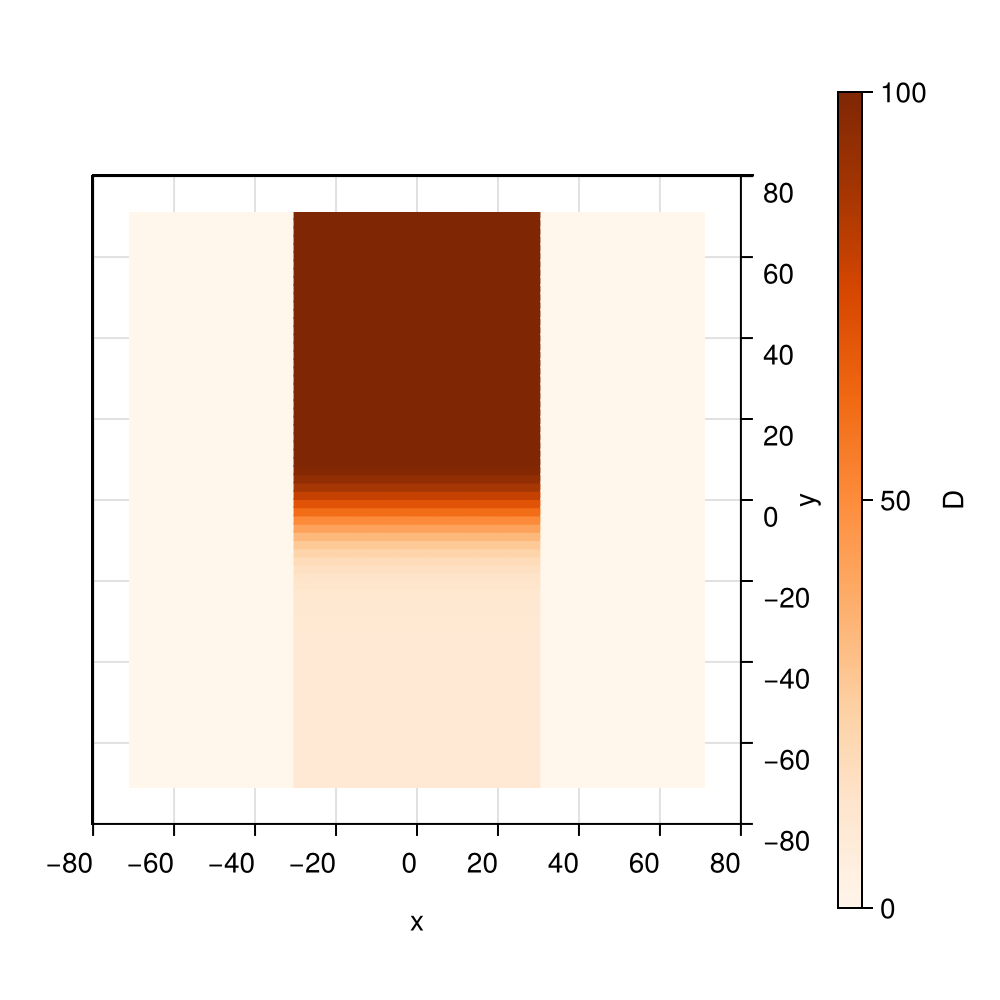

CairoMakie.Screen{IMAGE}


In [89]:
# Colormap común y colorrange fijo
# colormap = :viridis
simBox_cpu = Array(com.simBox)  # copia a CPU
colorrange = (0.0,  maximum(maximum(p -> maximum(p[:generation]), com_load)))
colormap_c=:Oranges
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:D_eff]), com_load)))
colorrange_c = (0.0,  com.D_c[1]*2)

fig = Figure(size=(500,500))

js = length(com_load)

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.c)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.c)[1]),
                Float64.(hcat(com_load[j][:D_eff]...)),
                colormap = colormap_c,
                colorrange = colorrange_c
            )
    




    xlims!(-80,80)
    ylims!(-80,80)
end

# Añadir colorbar común al final
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "D"
)

display(fig)



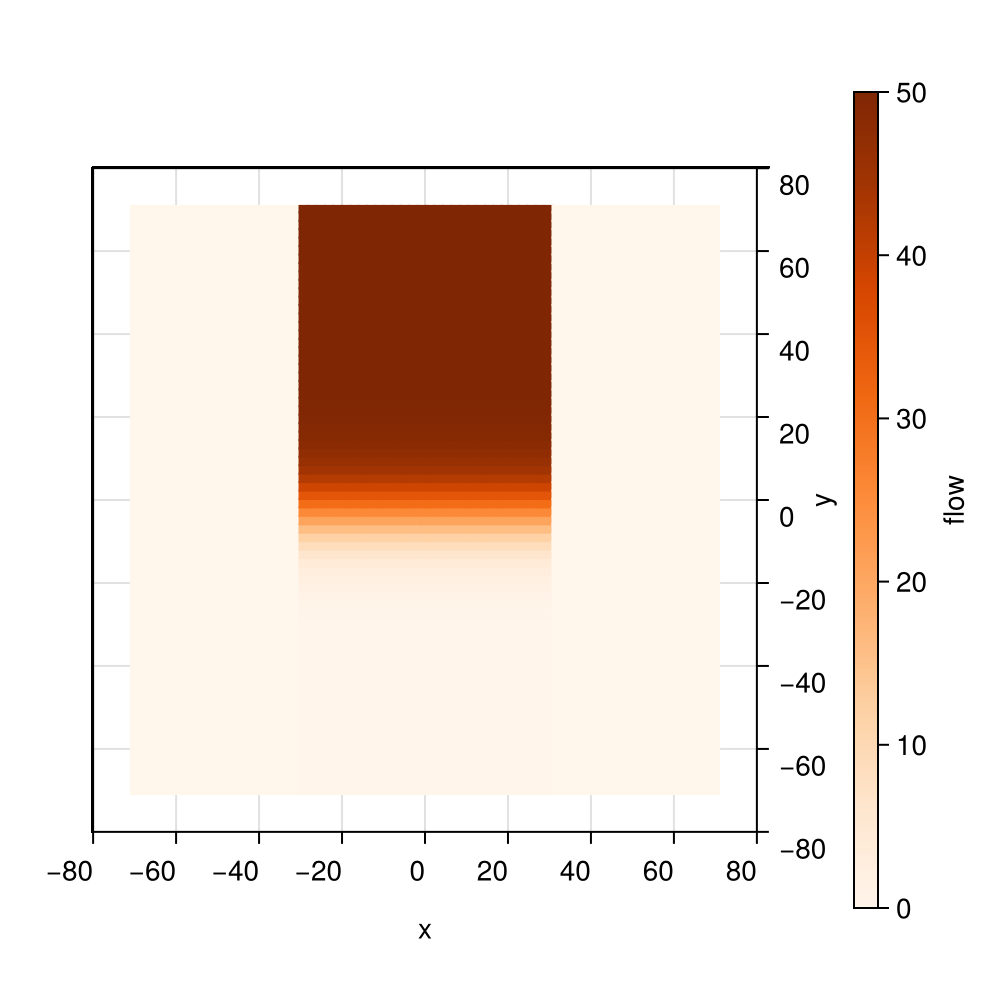

CairoMakie.Screen{IMAGE}


In [90]:
# Colormap común y colorrange fijo
# colormap = :viridis
simBox_cpu = Array(com.simBox)  # copia a CPU
colorrange = (0.0,  maximum(maximum(p -> maximum(p[:generation]), com_load)))
colormap_c=:Oranges
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:alpha_eff]), com_load)))
colorrange_c = (0.0,  com.alpha_c[1]*2)


fig = Figure(size=(500,500))

js =  length(com_load)

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.c)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.c)[1]),
                Float64.(hcat(com_load[j][:alpha_eff]...)),
                colormap = colormap_c,
                colorrange = colorrange_c
            )
    




    xlims!(-80,80)
    ylims!(-80,80)
end

# Añadir colorbar común al final
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "flow"
)

display(fig)



In [91]:
prev_steps=0
steps=Int(round(1.5/com.dt))
bringFromPlatform!(com)
com.c =0
com.growth = 0.1
com.beta_c = 0.001
com.Kc =0.5
open("Tods_c.txt", "w") do f
    # clear file at start
end

loadToPlatform!(com,preallocateAgents=N)


for step in 1+prev_steps:steps
    
    step!(com)
    for j in 1:Int(com.NMedium[1])

        for i in 21:50
            com.D_eff[i,j]=com.D_c[1]*(tanh(-0.1*(com.ymax[1]-(j-com.NMedium[2]/2)*2+5))+1)+10
            com.alpha_eff[i,j]=com.alpha_c[1]*(tanh(-0.1*(com.ymax[1]-(j-com.NMedium[2]/2)*2+5))+1)+0.1
        end

    end

    if step % saveEach == 0
        bringFromPlatform!(com)
        if N - com.N[1] <= 0
                println("Step ",step, " N: ", com.N[1], " preallocateAgents: ", N)
                @warn "More agents than preallocateAgents, stopping simulation."
                break
        elseif   N - com.N[1]  < 4*com.N[1]
                N = 15*com.N[1]
        end 
        println("Step ",step, " N: ", com.N[1])
        log_community_state(com.parameters, step)
        loadToPlatform!(com,preallocateAgents=N)
    end
end
bringFromPlatform!(com)

Step 1000 N: 954
Step 2000 N: 955
Step 3000 N: 957
Step 4000 N: 960
Step 5000 N: 960
Step 6000 N: 964
Step 7000 N: 967
Step 8000 N: 969
Step 9000 N: 973
Step 10000 N: 976
Step 11000 N: 981
Step 12000 N: 984
Step 13000 N: 985
Step 14000 N: 992
Step 15000 N: 996


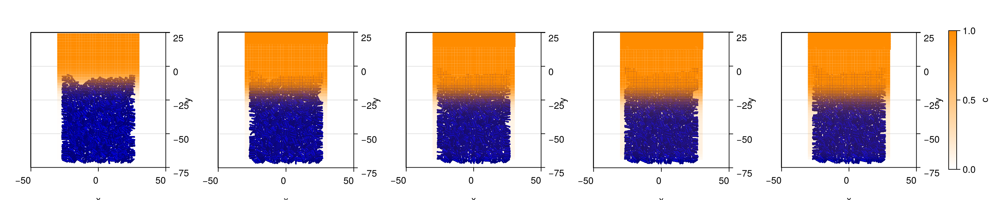

CairoMakie.Screen{IMAGE}


In [92]:
com_load,times=load_parameters_log("Tods_c.txt")
simBox_cpu = Array(com.simBox)  # copia a CPU


cmap_transp_orange = cgrad(
    [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
     RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
    256
)

colormap_c=cmap_transp_orange
# colormap_c=:Oranges
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:c]), com_load)))
fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    plotMixedAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:type],
    com_load[j][:fx],
    colorrange = (0, 0.03)
    )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.c)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.c)[1]),
            Float64.(hcat(com_load[j][:c]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-75,25)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "c"
)
display(fig)

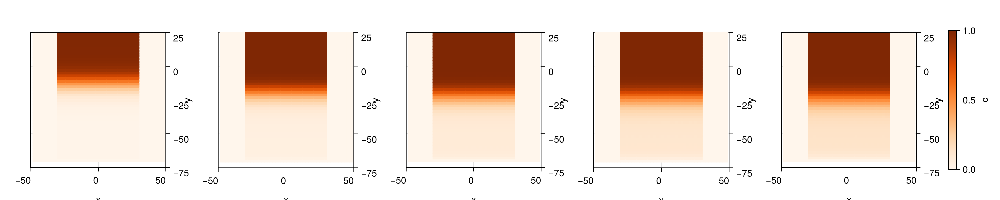

CairoMakie.Screen{IMAGE}


In [93]:
# Colormap común y colorrange fijo
# colormap = :viridis
simBox_cpu = Array(com.simBox)  # copia a CPU
colorrange = (0.0,  maximum(maximum(p -> maximum(p[:generation]), com_load)))
colormap_c=:Oranges
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:c]), com_load)))


fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.c)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.c)[1]),
                Float64.(hcat(com_load[j][:c]...)),
                colormap = colormap_c,
                colorrange = colorrange_c
            )
    



    xlims!(-50,50)
    ylims!(-75,25)
end

# Añadir colorbar común al final
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "c"
)

display(fig)



In [94]:
com_load[end][:c][35][35], com_load[end][:c][25][35]

(0.9998769274842452, 0.6896009254008972)

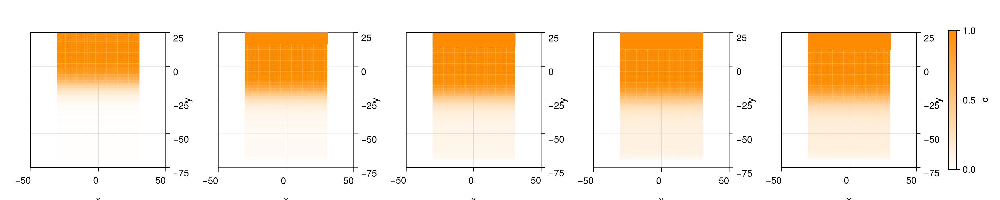

CairoMakie.Screen{IMAGE}


In [95]:
com_load,times=load_parameters_log("Tods_c.txt")
simBox_cpu = Array(com.simBox)  # copia a CPU


cmap_transp_orange = cgrad(
    [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
     RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
    256
)

colormap_c=cmap_transp_orange
# colormap_c=:Oranges
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:c]), com_load)))
fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotMixedAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:type],
    # com_load[j][:fx],
    # colorrange = (0, 0.03)
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.c)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.c)[1]),
            Float64.(hcat(com_load[j][:c]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-75,25)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "c"
)
display(fig)

In [103]:
# cx, cy = 0, 15
# R2 = 100  # comparamos con el cuadrado del radio para evitar sqrt
# com.growth = 0.2
com.type =0

for i in range(1,length(com.x))
    r =  com.y[i]-com.simBox[2,1]
    R =  30*exp(-0.1*com.x[i]^(2))
    prob = R^6/(R^6+r^6)
    if prob > rand()
        com.type[i] = 1
    else
        com.type[i] = 0
    end
end

println(sum(com.type .== 1))
log_community_state(com.parameters, steps)
com_load,times=load_parameters_log("Tods_c.txt")




53


(OrderedDict{Symbol, Any}[OrderedDict(:a_c => Any[0.0001], :Kc => Any[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5  …  0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5], :c => Any[Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0

In [104]:
println(sum(com_load[end][:type] .== 1))


53


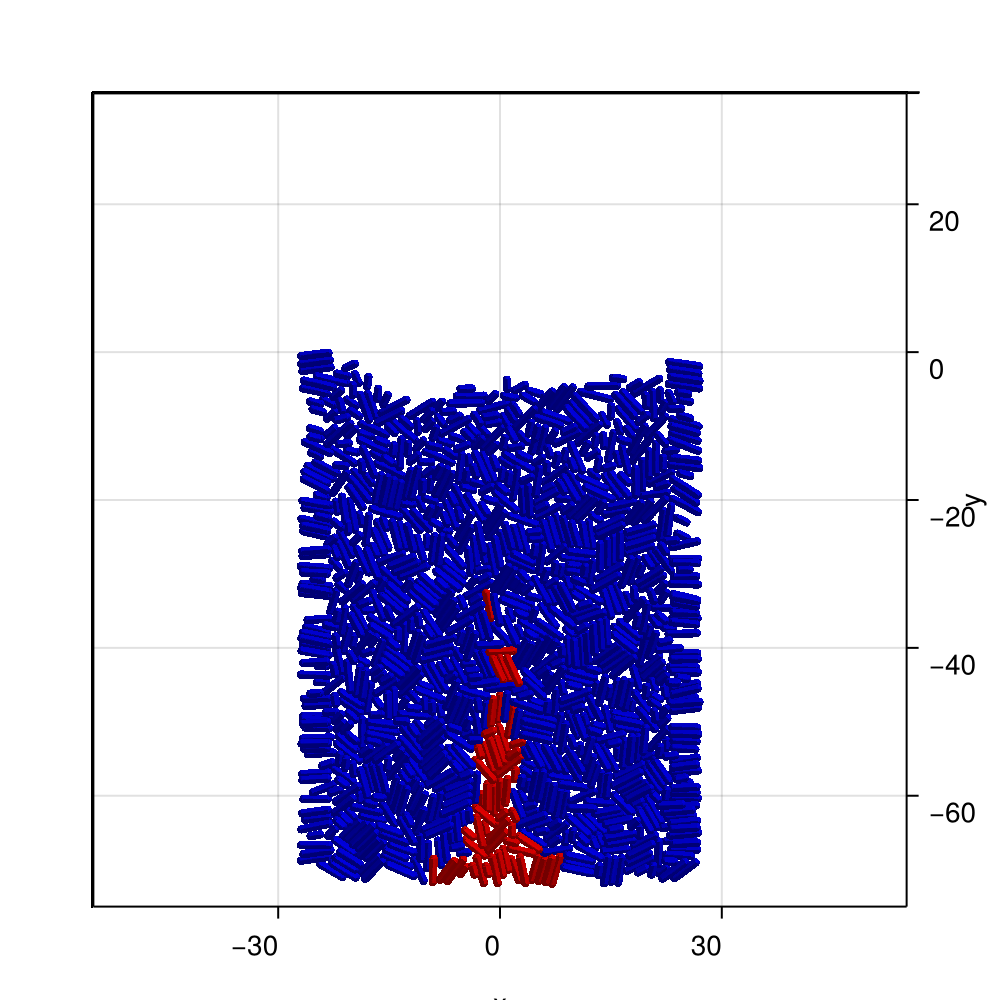

CairoMakie.Screen{IMAGE}


In [105]:


cmap_transp_orange = cgrad(
    [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
     RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
    256
)

colormap_c=cmap_transp_orange
# colormap_c=:Oranges
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:c]), com_load)))
fig = Figure(size=(500,500))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(length(com_load))
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    plotMixedAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:type],
    com_load[j][:fx],
    colorrange = (0, 0.03)
    )

    # m2 = heatmap!(ax,
    #         range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.c)[1]),
    #         range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.c)[1]),
    #         Float64.(hcat(com_load[j][:c]...)),
    #         colormap = colormap_c,
    #         colorrange = colorrange_c
    #     )


    xlims!(-55,55)
    ylims!(-75,35)
end

display(fig)

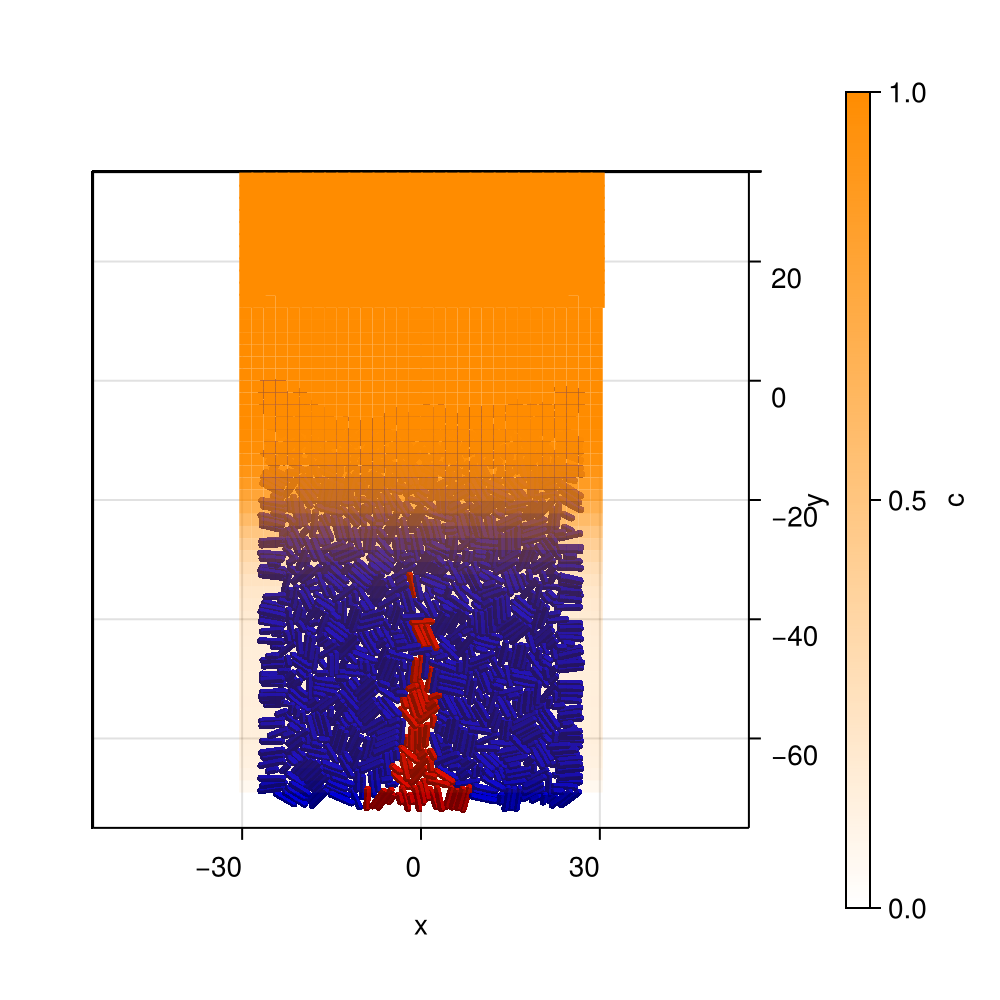

CairoMakie.Screen{IMAGE}


In [106]:
com_load,times=load_parameters_log("Tods_c.txt")
simBox_cpu = Array(com.simBox)  # copia a CPU


cmap_transp_orange = cgrad(
    [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
     RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
    256
)

colormap_c=cmap_transp_orange
# colormap_c=:Oranges
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:c]), com_load)))
fig = Figure(size=(500,500))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(length(com_load))
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    plotMixedAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:type],
    com_load[j][:fx],
    colorrange = (0, 0.03)
    )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.c)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.c)[1]),
            Float64.(hcat(com_load[j][:c]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-55,55)
    ylims!(-75,35)
end
Colorbar(fig[1, 2],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "c"
)
display(fig)

In [107]:
com_load,times=load_parameters_log("Tods_c.txt")

(OrderedDict{Symbol, Any}[OrderedDict(:a_c => Any[0.0001], :Kc => Any[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5  …  0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5], :c => Any[Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0

In [42]:
com.alpha_c=25
com.D_c=50
for j in 1:Int(com.NMedium[1])
    for i in 1:25
        com.D_eff[i,j]=0
        com.c[i,j]=0  
        com.alpha_eff[i,j]=0
    end
    for i in 26:45

        com.D_eff[i,j]=com.D_c[1]*(tanh(-0.1*(com.ymax[1]-(j-com.NMedium[2]/2)*2+5))+1)+10
        com.alpha_eff[i,j]=com.alpha_c[1]*(tanh(-0.1*(com.ymax[1]-(j-com.NMedium[2]/2)*2+5))+1)+0.1
    end
    for i in 46:70
        com.D_eff[i,j]=0 
        com.c[i,j]=0
        com.alpha_eff[i,j]=0

    end
end

com.x[1:length(com_load[end][:x])] = com_load[end][:x]
com.y[1:length(com_load[end][:y])] = com_load[end][:y]
com.l[1:length(com_load[end][:l])] = com_load[end][:l]
com.d[1:length(com_load[end][:d])] = com_load[end][:d]
com.theta[1:length(com_load[end][:theta])] = com_load[end][:theta]

vecs = [Float64.(v) for v in com_load[end][:c]]
c_load = hcat(vecs...)
com.c=c_load
com.PGA=0

0

In [ ]:
open("Motiles.txt", "w") do f
    # clear file at start
end
bringFromPlatform!(com)

com.PGA=0
com.alpha_PGA = 100
com.delta_PGA = 1
com.D_PGA = 10
com.Kch= 0.5
com.v = 1

log_community_state(com.parameters, steps, "Motiles.txt")

In [116]:
prev_steps=0
steps=Int(round(3/com.dt))


loadToPlatform!(com,preallocateAgents=N)


for step in 1+prev_steps:steps
    
    step!(com)

    for j in 1:Int(com.NMedium[1])

        for i in 26:45
            com.D_eff[i,j]=com.D_c[1]*(tanh(-0.1*(com.ymax[1]-(j-com.NMedium[2]/2)*2+5))+1)+10
            com.alpha_eff[i,j]=com.alpha_c[1]*(tanh(-0.1*(com.ymax[1]-(j-com.NMedium[2]/2)*2+5))+1)+0.1
        end

    end

    if step % saveEach == 0
        bringFromPlatform!(com)
        if N - com.N[1] <= 0
                println("Step ",step, " N: ", com.N[1], " preallocateAgents: ", N)
                @warn "More agents than preallocateAgents, stopping simulation."
                break
        elseif   N - com.N[1]  < 4*com.N[1]
                N = 15*com.N[1]
        end 
        println("Step ",step, " N: ", com.N[1])
        log_community_state(com.parameters, step, "Motiles.txt")
        loadToPlatform!(com,preallocateAgents=N)
    end
end
bringFromPlatform!(com)


Step 11000 N: 1044
Step 12000 N: 1047
Step 13000 N: 1051
Step 14000 N: 1058
Step 15000 N: 1060
Step 16000 N: 1065
Step 17000 N: 1070
Step 18000 N: 1079
Step 19000 N: 1088
Step 20000 N: 1090
Step 21000 N: 1094
Step 22000 N: 1096
Step 23000 N: 1102
Step 24000 N: 1112
Step 25000 N: 1118
Step 26000 N: 1132
Step 27000 N: 1143
Step 28000 N: 1155
Step 29000 N: 1162
Step 30000 N: 1172


In [117]:

bringFromPlatform!(com)

In [118]:
com_load,times=load_parameters_log("Motiles.txt")


(OrderedDict{Symbol, Any}[OrderedDict(:a_c => Any[0.0001], :Kc => Any[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5  …  0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5], :c => Any[Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Any[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0

In [119]:
maximum(maximum(p -> maximum(p[:PGA]), com_load))

7.143262262422355

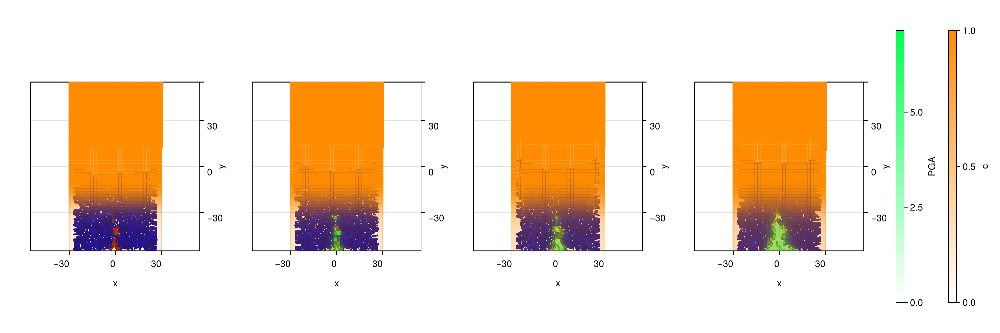

CairoMakie.Screen{IMAGE}


In [120]:
simBox_cpu = Array(com.simBox)  # copia a CPU

cmap_transp_green = cgrad(
    [RGBAf(0, 1, 0.3, 0.0),   # verde con alfa 0 (transparente)
     RGBAf(0, 1, 0.3, 1.0)],  # verde con alfa 1 (opaco)
    256
)
cmap_transp_orange = cgrad(
    [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
     RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
    256
)
colormap_PGA=cmap_transp_green
# colormap_PGA=:Greens
colorrange_PGA = (0.0,  maximum(maximum(p -> maximum(p[:PGA]), com_load)))
colormap_c=cmap_transp_orange
# colormap_c=:Oranges
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:c]), com_load)))
fig = Figure(size=(1500,500))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)][1:4]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    plotMixedAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:type],
    com_load[j][:fx],
    colorrange = (0, 0.03)
    )
    m1 = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PGA)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PGA)[1]),
                Float64.(hcat(com_load[j][:PGA]...)),
                colormap = colormap_PGA,
                colorrange = colorrange_PGA
            )
    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.c)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.c)[1]),
            Float64.(hcat(com_load[j][:c]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )


    xlims!(-55,55)
    ylims!(-55,55)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_PGA,
    colorrange = colorrange_PGA,
    label = "PGA"
)
Colorbar(fig[1, length(js) + 2],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "c"
)

display(fig)

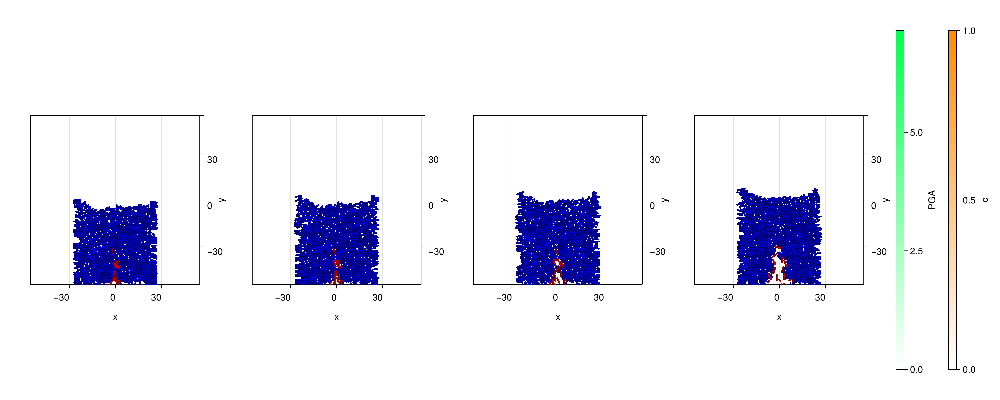

CairoMakie.Screen{IMAGE}


In [121]:
simBox_cpu = Array(com.simBox)  # copia a CPU

cmap_transp_green = cgrad(
    [RGBAf(0, 1, 0.3, 0.0),   # verde con alfa 0 (transparente)
     RGBAf(0, 1, 0.3, 1.0)],  # verde con alfa 1 (opaco)
    256
)
cmap_transp_orange = cgrad(
    [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
     RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
    256
)
colormap_PGA=cmap_transp_green
# colormap_PGA=:Greens
colorrange_PGA = (0.0,  maximum(maximum(p -> maximum(p[:PGA]), com_load)))
colormap_c=cmap_transp_orange
# colormap_c=:Oranges
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:c]), com_load)))
fig = Figure(size=(1500,600))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)][1:4]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    plotMixedAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:type],
    com_load[j][:fx],
    colorrange = (0, 0.03)
    )
    # m1 = heatmap!(ax,
    #             range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PGA)[1]),
    #             range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PGA)[1]),
    #             Float64.(hcat(com_load[j][:PGA]...)),
    #             colormap = colormap_PGA,
    #             colorrange = colorrange_PGA
    #         )
    # m2 = heatmap!(ax,
    #         range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.c)[1]),
    #         range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.c)[1]),
    #         Float64.(hcat(com_load[j][:c]...)),
    #         colormap = colormap_c,
    #         colorrange = colorrange_c
    #     )


    xlims!(-55,55)
    ylims!(-55,55)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_PGA,
    colorrange = colorrange_PGA,
    label = "PGA"
)
Colorbar(fig[1, length(js) + 2],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "c"
)

display(fig)

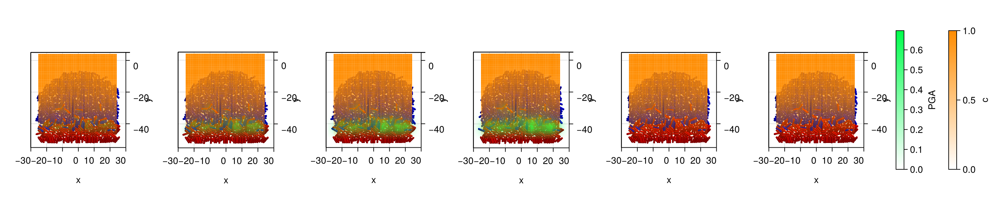

CairoMakie.Screen{IMAGE}


In [51]:
simBox_cpu = Array(com.simBox)  # copia a CPU

cmap_transp_green = cgrad(
    [RGBAf(0, 1, 0.3, 0.0),   # verde con alfa 0 (transparente)
     RGBAf(0, 1, 0.3, 1.0)],  # verde con alfa 1 (opaco)
    256
)
cmap_transp_orange = cgrad(
    [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
     RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
    256
)
colormap_PGA=cmap_transp_green
# colormap_PGA=:Greens
colorrange_PGA = (0.0,  maximum(maximum(p -> maximum(p[:PGA]), com_load)))
colormap_c=cmap_transp_orange
# colormap_c=:Oranges
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:c]), com_load)))
fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    plotMixedAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:type],
    com_load[j][:fx],
    colorrange = (0, 0.03)
    )
    m1 = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PGA)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PGA)[1]),
                Float64.(hcat(com_load[j][:PGA]...)),
                colormap = colormap_PGA,
                colorrange = colorrange_PGA
            )
    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.c)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.c)[1]),
            Float64.(hcat(com_load[j][:c]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )


    xlims!(-30,30)
    ylims!(-55,5)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_PGA,
    colorrange = colorrange_PGA,
    label = "PGA"
)
Colorbar(fig[1, length(js) + 2],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "c"
)

display(fig)

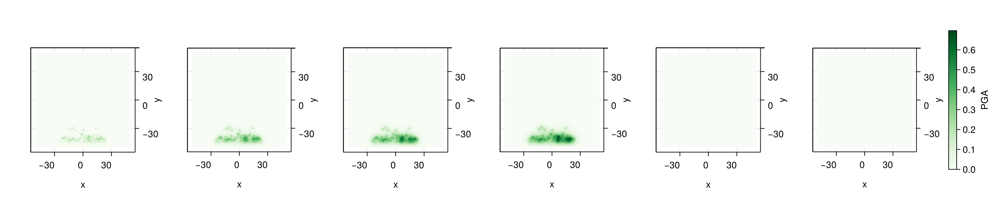

CairoMakie.Screen{IMAGE}


In [50]:
# Colormap común y colorrange fijo
# colormap = :viridis
simBox_cpu = Array(com.simBox)  # copia a CPU
colorrange = (0.0,  maximum(maximum(p -> maximum(p[:generation]), com_load)))
colormap_PGA=:Greens
colorrange_PGA = (0.0,  maximum(maximum(p -> maximum(p[:PGA]), com_load)))


fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PGA)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PGA)[1]),
                Float64.(hcat(com_load[j][:PGA]...)),
                colormap = colormap_PGA,
                colorrange = colorrange_PGA
            )
    




    xlims!(-55,55)
    ylims!(-55,55)
end

# Añadir colorbar común al final
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_PGA,
    colorrange = colorrange_PGA,
    label = "PGA"
)

display(fig)

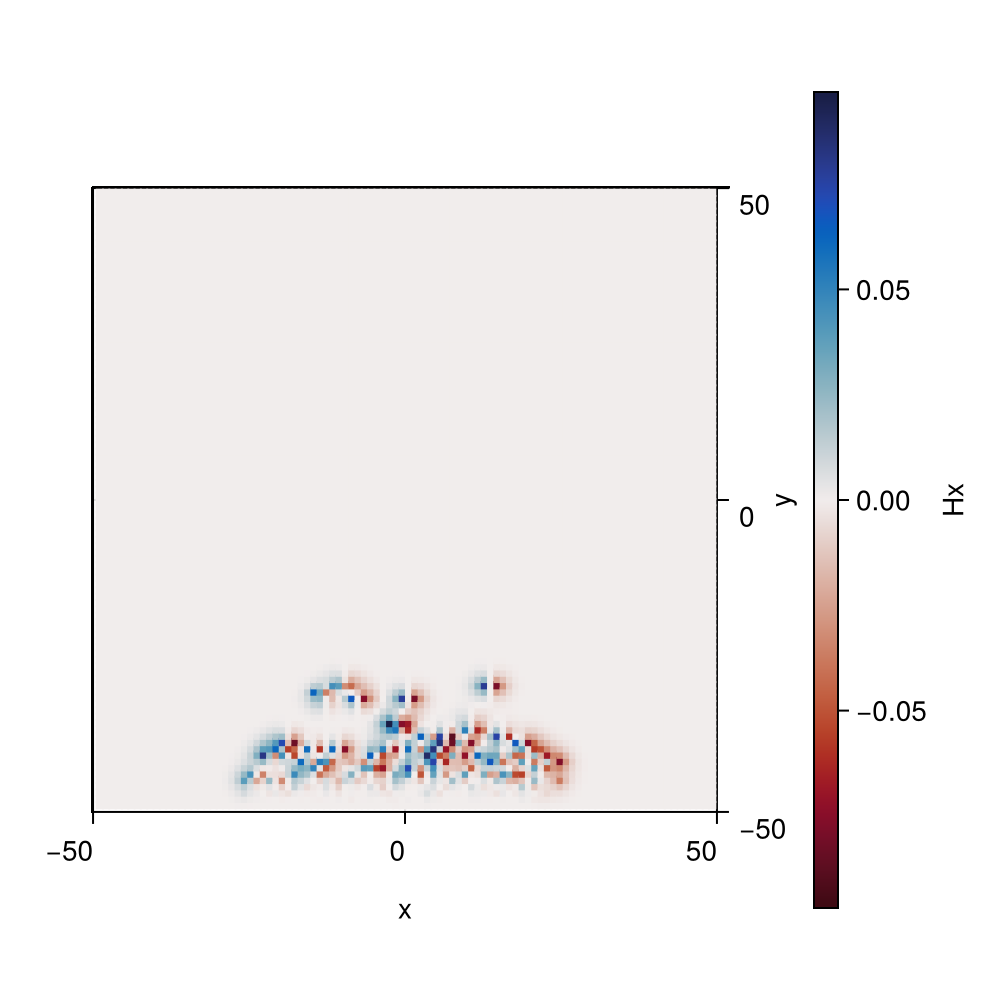

CairoMakie.Screen{IMAGE}


In [48]:
# Colormap común y colorrange fijo
colormap = Reverse(:balance)
minval= minimum(minimum(p -> minimum(p[:Hx]), com_load))
maxval= maximum(maximum(p -> maximum(p[:Hx]), com_load))
maxrange= maximum(abs.([minval, maxval]))
colorrange = (-maxrange, maxrange)

fig = Figure(size=(500,500))

js =length(com_load)

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.Hx)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.Hx)[1]),
                Float64.(hcat(com_load[j][:Hx]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    

    # plotMixedAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:type],
    # com_load[j][:pressure],
    # colorrange = (0, 0.03)
    # )

    xlims!(-50,50)
    ylims!(-50,50)
end

# Añadir colorbar común al final
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "Hx"
)

display(fig)

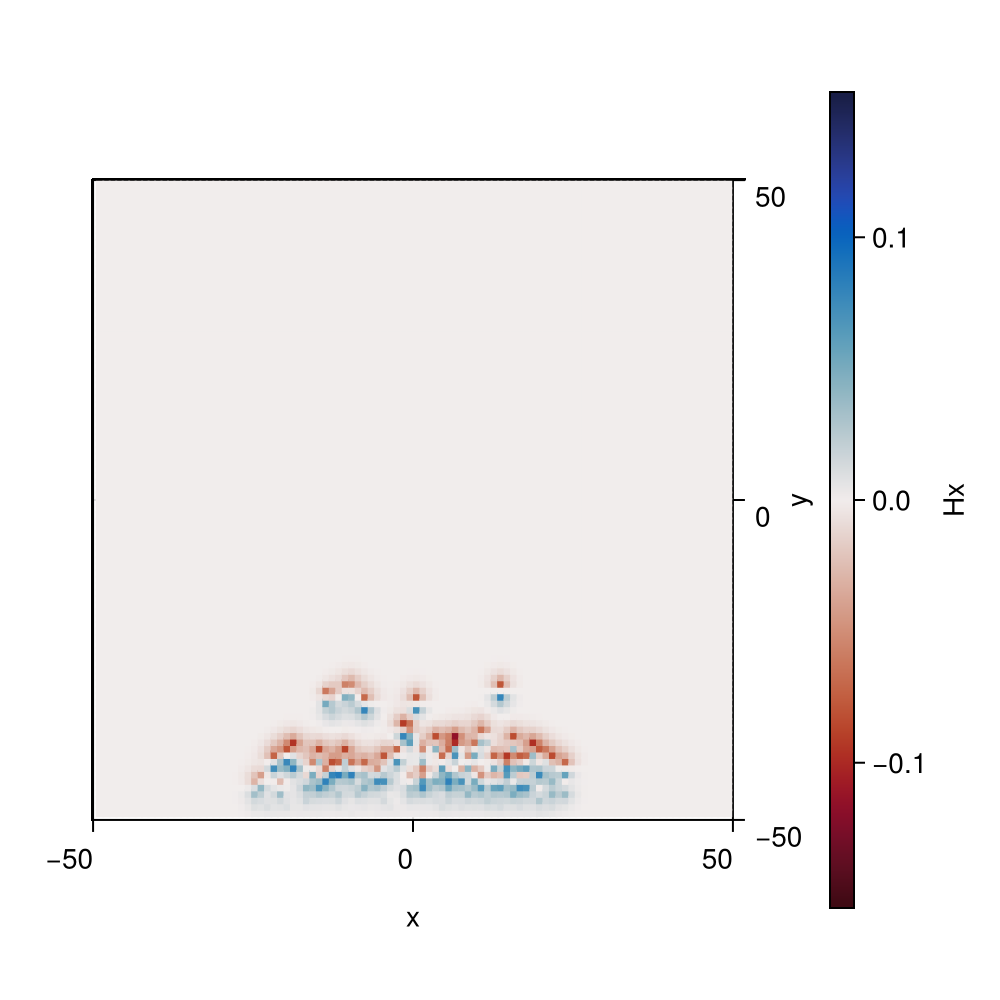

CairoMakie.Screen{IMAGE}


In [49]:
# Colormap común y colorrange fijo
colormap = Reverse(:balance)
minval= minimum(minimum(p -> minimum(p[:Hy]), com_load))
maxval= maximum(maximum(p -> maximum(p[:Hy]), com_load))
maxrange= maximum(abs.([minval, maxval]))
colorrange = (-maxrange, maxrange)

fig = Figure(size=(500,500))

js =length(com_load)

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.Hy)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.Hy)[1]),
                Float64.(hcat(com_load[j][:Hy]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    

    # plotMixedAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:type],
    # com_load[j][:pressure],
    # colorrange = (0, 0.03)
    # )

    xlims!(-50,50)
    ylims!(-50,50)
end

# Añadir colorbar común al final
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "Hx"
)

display(fig)

In [ ]:
open("Motiles.txt", "w") do f
    # clear file at start
end
bringFromPlatform!(com)

com.v = 0.5

log_community_state(com.parameters, steps, "Motiles.txt")

In [ ]:
prev_steps=33000
steps=Int(round(10/com.dt))
com.growth = 0.0
com.v = 0.2

loadToPlatform!(com,preallocateAgents=N)


for step in 1+prev_steps:steps
    
    step!(com)

    if step % saveEach == 0
        bringFromPlatform!(com)
        if N - com.N[1] <= 0
                println("Step ",step, " N: ", com.N[1], " preallocateAgents: ", N)
                @warn "More agents than preallocateAgents, stopping simulation."
                break
        elseif   N - com.N[1]  < 4*com.N[1]
                N = 15*com.N[1]
        end 
        println("Step ",step, " N: ", com.N[1])
        log_community_state(com.parameters, step, "Motiles.txt")
        loadToPlatform!(com,preallocateAgents=N)
    end
end
bringFromPlatform!(com)


Step 34000 N: 1667
Step 35000 N: 1667
Step 36000 N: 1667
Step 37000 N: 1667
Step 38000 N: 1667
Step 39000 N: 1667
Step 40000 N: 1667
Step 41000 N: 1667
Step 42000 N: 1667
Step 43000 N: 1667
Step 44000 N: 1667
Step 45000 N: 1667
Step 46000 N: 1667
Step 47000 N: 1667
Step 48000 N: 1667
Step 49000 N: 1667
Step 50000 N: 1667
Step 51000 N: 1667
Step 52000 N: 1667
Step 53000 N: 1667
Step 54000 N: 1667
Step 55000 N: 1667
Step 56000 N: 1667
Step 57000 N: 1667
Step 58000 N: 1667
Step 59000 N: 1667
Step 60000 N: 1667
Step 61000 N: 1667
Step 62000 N: 1667
Step 63000 N: 1667
Step 64000 N: 1667
Step 65000 N: 1667
Step 66000 N: 1667
Step 67000 N: 1667
Step 68000 N: 1667
Step 69000 N: 1667
Step 70000 N: 1667
Step 71000 N: 1667
Step 72000 N: 1667
Step 73000 N: 1667
Step 74000 N: 1667
Step 75000 N: 1667
Step 76000 N: 1667
Step 77000 N: 1667
Step 78000 N: 1667
Step 79000 N: 1667
Step 80000 N: 1667
Step 81000 N: 1667
Step 82000 N: 1667
Step 83000 N: 1667
Step 84000 N: 1667
Step 85000 N: 1667
Step 86000 N

In [ ]:
com_load,times=load_parameters_log("Motiles.txt")


(OrderedDict{Symbol, Any}[OrderedDict(:W => Any[0.03579283878207207, -0.6720467805862427, 0.004583272151648998, -0.6610364317893982, 0.018495962023735046, 0.6556819081306458, -0.09643267840147018, 0.03173419088125229, -1.3227440118789673, -0.18344320356845856  …  -0.9855020642280579, 0.3964286744594574, -0.05929975584149361, -0.0010273612570017576, 0.1480298936367035, -0.06439413130283356, 0.3769832253456116, 0.11779405921697617, 0.17322981357574463, -3.3610293865203857], :D_PGA => Any[20.0], :fx => Any[-0.20357204973697662, 0.19742876291275024, 0.01590423658490181, -0.4136926233768463, -0.07443034648895264, -0.020842505618929863, -0.28177177906036377, -0.09233207255601883, 0.08324774354696274, -0.352988064289093  …  0.9681625962257385, -0.22851194441318512, -0.7100681066513062, -0.03566070646047592, 0.011125199496746063, -0.12857753038406372, 1.1033190488815308, -0.5415639877319336, -0.3852245807647705, 0.15267810225486755], :x => Any[-30.770484924316406, 2.3863275051116943, 6.5912995

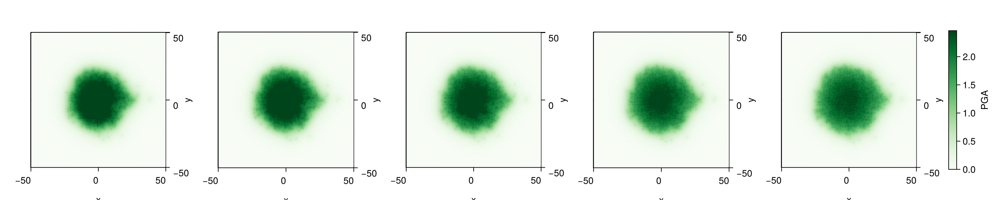

CairoMakie.Screen{IMAGE}


In [ ]:
# Colormap común y colorrange fijo
# colormap = :viridis
simBox_cpu = Array(com.simBox)  # copia a CPU
colorrange = (0.0,  maximum(maximum(p -> maximum(p[:generation]), com_load)))
colormap_PGA=:Greens
colorrange_PGA = (0.0,  maximum(maximum(p -> maximum(p[:PGA]), com_load)))


fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PGA)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PGA)[1]),
                Float64.(hcat(com_load[j][:PGA]...)),
                colormap = colormap_PGA,
                colorrange = colorrange_PGA
            )
    



    xlims!(-50,50)
    ylims!(-50,50)
end

# Añadir colorbar común al final
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_PGA,
    colorrange = colorrange_PGA,
    label = "PGA"
)

display(fig)

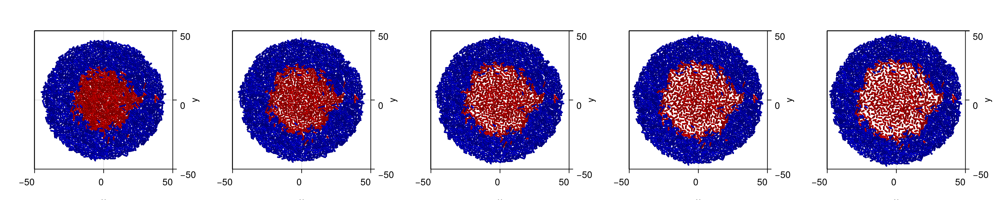

CairoMakie.Screen{IMAGE}


In [ ]:
fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    plotMixedAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:type],
    com_load[j][:theta],
    colorrange = (0, 0.03)
    )

    xlims!(-50,50)
    ylims!(-50,50)
end

display(fig)

In [86]:
function plotMixedAgents!(ax, x, y, d, l, angle, type, p; kargs...)
    # Diccionario de tipos a colormaps (puedes extenderlo con más tipos y colores)
    colormap_dict = Dict(
        0 => :Blues,
        1 => :Reds,
        2 => :Greens,
        3 => :Oranges,
        4 => :Purples,
        5 => :Greys
    )

    for (xi, yi, li, di, ai, ti, pi) in zip(x, y, l, d, angle, type, p)
        # Colormap según tipo, o uno genérico si no está definido
        colormap = get(colormap_dict, ti, :viridis)

        # Color numérico según p
        colorval = pi

        # Esferas en los extremos
        for dx in (-1, 1)
            meshscatter!(ax,
                [xi + dx * li/2 * cos(ai)],
                [yi + dx * li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color = colorval,
                colormap = colormap,
                kargs...
            )
        end

        # Cuerpo alargado
        meshscatter!(ax,
            [xi],
            [yi];
            marker = Cylinder(Point3f(-.5, 0, 0), Point3f(.5, 0, 0), Float32(1)),
            markersize = [Point3f(li, di/2, di/2)],
            rotation = [ai],
            color = colorval,
            colormap = colormap,
            kargs...
        )
    end
    return
end


plotMixedAgents! (generic function with 1 method)

In [ ]:
# Colormap común y colorrange fijo
# colormap = :viridis
colorrange = (0.0,  maximum(maximum(p -> maximum(p[:generation]), com_load)))
colormap_c=:Oranges
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:c]), com_load)))


fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(com.simBox[1,1],com.simBox[1,2],length=size(com.c)[1]),
                range(com.simBox[2,1],com.simBox[2,2],length=size(com.c)[1]),
                Float64.(hcat(com_load[j][:c]...)),
                colormap = colormap_c,
                colorrange = colorrange_c
            )
    

    plotMixedAgents!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:type],
    com_load[j][:generation],
    colorrange = colorrange
    )

    xlims!(-50,50)
    ylims!(-50,50)
end

# Añadir colorbar común al final
# Colorbar(fig[1, length(js) + 1],
#     colormap = colormap,
#     colorrange = colorrange,
#     label = "QS"
# )

display(fig)

In [ ]:
function plot_evolution_by_type_from_positions(com)
    colormap_dict = Dict(
        0 => :Blues,
        1 => :Reds,
        2 => :Greens,
        3 => :Oranges,
        4 => :Purples,
        5 => :Greys
    )

    tipos = unique(com[end][:type])
    tipos = sort(tipos)[2:end]

    first_gen = Dict{Int, NamedTuple}()

    for t in sort(collect(keys(com)))
        for (i, ti) in enumerate(com[t][:type])
            if !(ti in keys(first_gen))
                first_gen[ti] = (
                    tiempo = t,
                    index = i,
                    x0 = com[t][:x][i],
                    y0 = com[t][:y][i]
                )
            end
        end
    end

    fig = Figure()
    ax = Axis(fig[1, 1], 
            xlabel = "θ",
            ylabel = "r",
            yreversed = true,
            )

    for t in sort(collect(keys(com)))
        com_t = com[t]

        for ti in tipos
            indices = findall(com_t[:type] .== ti)
            if isempty(indices)
                continue
            end

            f = first_gen[ti]
            x0, y0 = f.x0, f.y0
            gen0 = f.tiempo

            xs = com_t[:x][indices]
            ys = com_t[:y][indices]
            gens = fill(t - gen0, length(indices))

            distances = sqrt.((xs).^2 .+ (ys).^2)

            # Ángulo relativo calculado por desplazamiento
            angles = atan.(ys, xs)  



            colormap = haskey(colormap_dict, ti) ? colormap_dict[ti] : error("Tipo $ti no tiene colormap definido")

            scatter!(ax, angles, distances;
                color = gens,
                colormap = colormap,
                markersize = 10,
                label = "Tipo $ti",
                colorrange = (0, length(com)),
            )
        end
    end

    # axislegend(ax)
    return fig
end


plot_evolution_by_type_from_positions (generic function with 1 method)

In [ ]:
function plot_evolution(com)
    colormap_dict = Dict(
        0 => :Blues,
        1 => :Reds,
        2 => :Greens,
        3 => :Oranges,
        4 => :Purples,
        5 => :Greys
    )

    tipos = unique(com[end][:type])
    tipos = sort(tipos)[2:end]

    first_gen = Dict{Int, NamedTuple}()

    for t in sort(collect(keys(com)))
        for (i, ti) in enumerate(com[t][:type])
            if !(ti in keys(first_gen))
                first_gen[ti] = (
                    tiempo = t,
                    index = i,
                    x0 = com[t][:x][i],
                    y0 = com[t][:y][i]
                )
            end
        end
    end

    fig = Figure(backgroundcolor = :black)  # Fondo negro

    ax = Axis(
        fig[1, 1],
        xlabel = "θ",  # Letra griega
        ylabel = "r",
        yreversed = true,
        backgroundcolor = :black,
        xlabelcolor = :white,
        ylabelcolor = :white,
        xticklabelcolor = :white,
        yticklabelcolor = :white,
        xtickcolor = :white,
        ytickcolor = :white,
        bottomspinecolor = :white,
        leftspinecolor = :white,
        rightspinecolor = :white,
        topspinecolor = :white
    )

    for t in sort(collect(keys(com)))
        com_t = com[t]

        for ti in tipos
            indices = findall(com_t[:type] .== ti)
            if isempty(indices)
                continue
            end

            f = first_gen[ti]
            x0, y0 = f.x0, f.y0
            gen0 = f.tiempo

            xs = com_t[:x][indices]
            ys = com_t[:y][indices]
            gens = fill(t - gen0, length(indices))

            distances = sqrt.((xs).^2 .+ (ys).^2)
            angles = atan.(ys, xs)

            colormap = get(colormap_dict, ti, :viridis)

            scatter!(ax, angles, distances;
                color = gens,
                colormap = colormap,
                markersize = 10,
                label = "Tipo $ti",
                colorrange = (0, length(com)),
            )
        end
    end

    return fig
end


plot_evolution (generic function with 1 method)

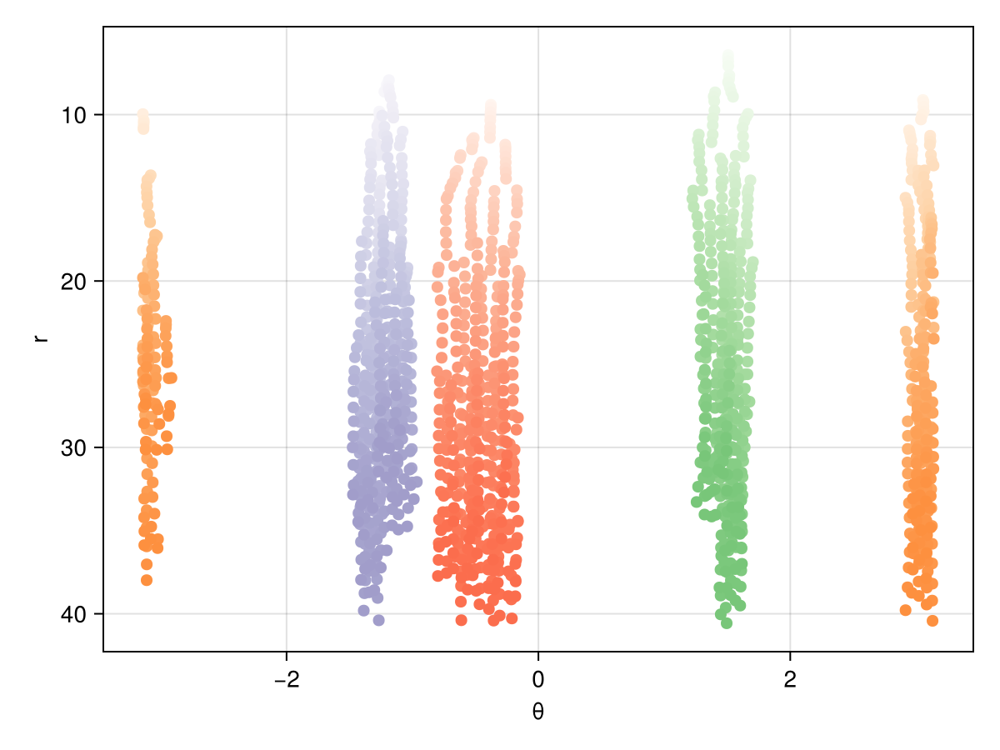

In [ ]:
plot_evolution_by_type_from_positions(com_load)

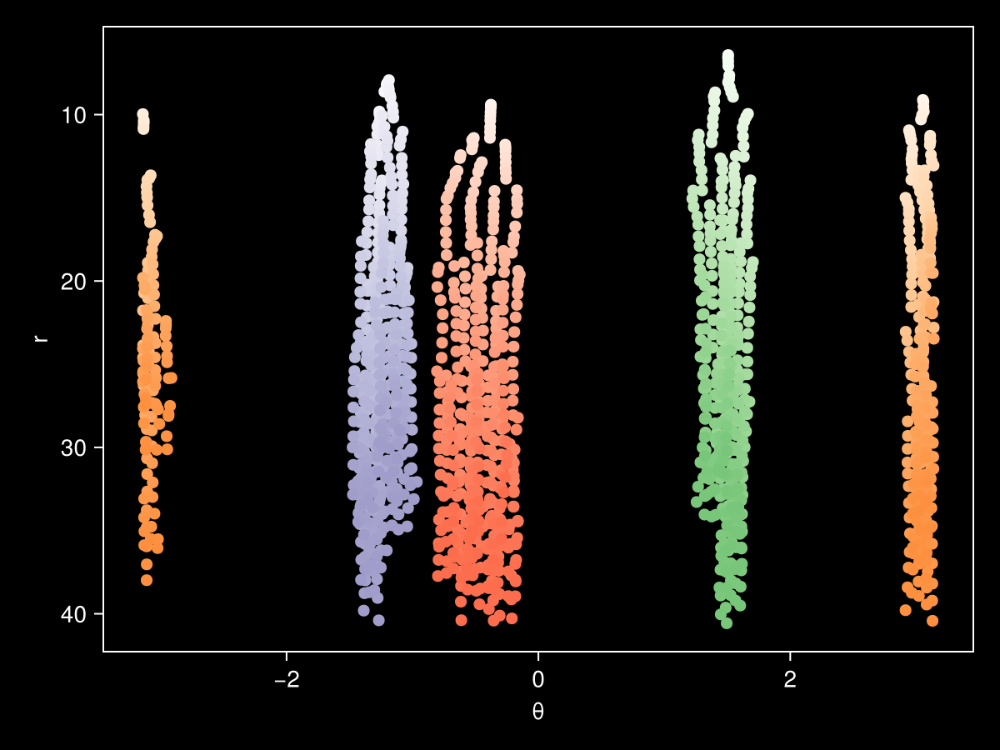

In [ ]:
plot_evolution(com_load)


In [102]:

# Crear figura y ejes
fig = Figure(size = (800, 600))
grid = fig[1, 1] = GridLayout()
ax = Axis(grid[1, 1]; aspect = DataAspect())


# colorrange = (0.0,  maximum(maximum(p -> maximum(p[:generation]), com_load)))
colorrange = (0.0,  2.)

Makie.record(fig, "Tods_c.mp4", 1:Int(length(com_load)); framerate = 15) do j
 
    Makie.empty!(ax)
   
    plotMixedAgents!(
        ax,
        com_load[j][:x],
        com_load[j][:y],
        com_load[j][:d],
        com_load[j][:l],
        com_load[j][:theta],
        com_load[j][:type],
        com_load[j][:d],
        colorrange = colorrange
    )

    xlims!(ax, -50, 50)
    ylims!(ax, -75, 25)
end


"Tods_c.mp4"